<h2> Importing the packages </h2>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

import numpy as np
import seaborn as sns
from scipy import stats
from sklearn import linear_model

from sklearn import tree
from sklearn import ensemble
from sklearn import neural_network
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import plot_roc_curve,plot_precision_recall_curve

## Tensorflow stuff:
import tensorflow as tf
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Dropout
!pip install -q -U keras-tuner
import kerastuner as kt

np.random.seed(42)

# Import additional libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# import visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


## Importing Smote
from imblearn.over_sampling import SMOTE


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.3/167.3 KB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 25.7 MB/s eta 0:00:00


<ipython-input-1-158034b7b761>:26: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  import kerastuner as kt


## <u>Loading the Data<u/>

In [2]:
## Importing the dataset: 
from google.colab import drive
drive.mount('/content/drive')
credit = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Datasets/Credit card default I.csv")




## If done on local machine, uncomment this line of code:
## df = pd.read_csv("/Users/junlongng/Desktop/NTU/Year_2/Semester 2/BC3415 AI in ACC & Finance/Week 4 Regression/Homework/Loan Default (Employed).csv")


Mounted at /content/drive


## <u>Data Exploration and Data Cleaning<u/>

In [3]:
credit.isnull().any()

ID                            False
LIMIT_BAL                     False
SEX                           False
EDUCATION                     False
MARRIAGE                      False
AGE                           False
PAY_0                         False
PAY_2                         False
PAY_3                         False
PAY_4                         False
PAY_5                         False
PAY_6                         False
BILL_AMT1                     False
BILL_AMT2                     False
BILL_AMT3                     False
BILL_AMT4                     False
BILL_AMT5                     False
BILL_AMT6                     False
PAY_AMT1                      False
PAY_AMT2                      False
PAY_AMT3                      False
PAY_AMT4                      False
PAY_AMT5                      False
PAY_AMT6                      False
default payment next month    False
dtype: bool

In [4]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

In [5]:
credit.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603700,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489136,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [6]:
#renaming column
credit.rename(columns={'default payment next month' : 'DefaultStatus'}, inplace=True)

<AxesSubplot:xlabel='DefaultStatus', ylabel='count'>

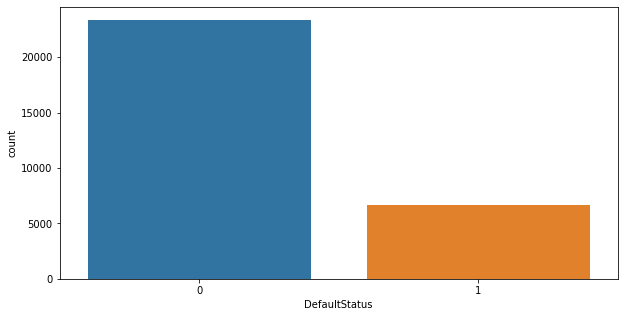

In [7]:
plt.figure(figsize=(10,5))
sns.countplot(x = 'DefaultStatus', data = credit)
#imbalanced dataset, will need to oversample using SMOTE

In [8]:
credit['SEX'].value_counts()

2    18111
1    11889
Name: SEX, dtype: int64

<AxesSubplot:xlabel='SEX', ylabel='count'>

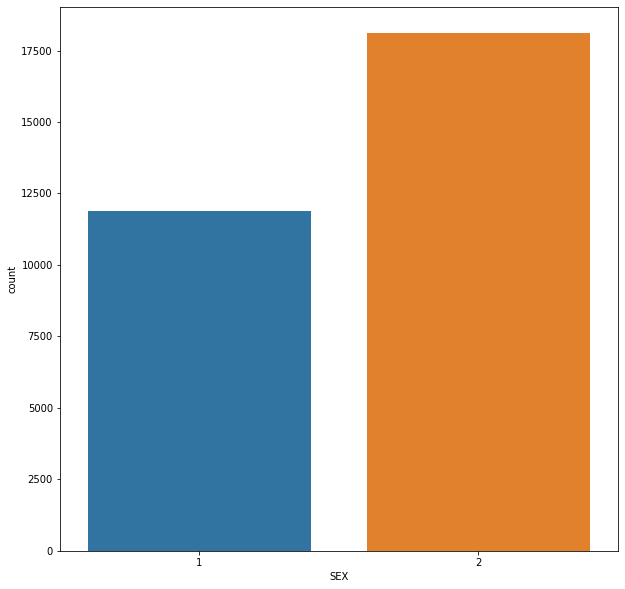

In [9]:
plt.figure(figsize = (10,10))
sns.countplot(x="SEX", data=credit)

In [10]:
#reassigning values of SEX for easier understanding
credit.replace({"SEX":{1:"MALE",2:"FEMALE"}},inplace=True)
credit['SEX'].value_counts()

FEMALE    18111
MALE      11889
Name: SEX, dtype: int64

In [11]:
credit['EDUCATION'].value_counts()
#values 0, 5, and 6 are not in the description

2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: EDUCATION, dtype: int64

In [12]:
#reassigning values 0,5, and 6 as 4 (others) and reassigning numbers with words for easier understanding
credit.loc[(credit['EDUCATION'] == 0) | (credit['EDUCATION'] == 5) | (credit['EDUCATION'] == 6), 'EDUCATION'] = 4
credit.replace({"EDUCATION":{1:"GRAD_SCHOOL",2:"UNIVERSITY",3:"HIGH_SCHOOL",4:"OTHERS"}},inplace=True)
credit['EDUCATION'].value_counts()

UNIVERSITY     14030
GRAD_SCHOOL    10585
HIGH_SCHOOL     4917
OTHERS           468
Name: EDUCATION, dtype: int64

<AxesSubplot:xlabel='EDUCATION', ylabel='count'>

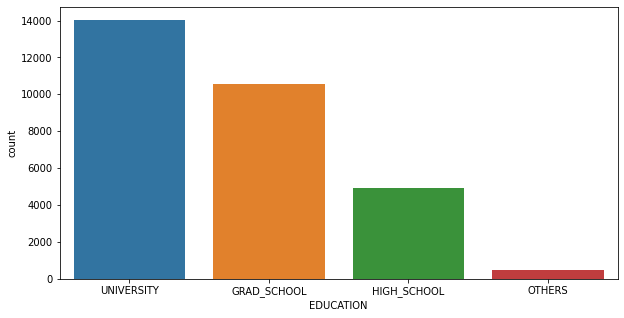

In [13]:
plt.figure(figsize=(10,5))
sns.countplot(x = 'EDUCATION', data = credit)

In [14]:
credit['MARRIAGE'].value_counts()
#value 0 is not in the description

2    15964
1    13659
3      323
0       54
Name: MARRIAGE, dtype: int64

In [15]:
#reassigning value 0 as 3 (others) and reassigning numbers with words for easier understanding
credit.loc[(credit['MARRIAGE'] == 0), 'MARRIAGE'] = 3
credit.replace({"MARRIAGE":{1:"MARRIED",2:"SINGLE",3:"OTHERS"}},inplace=True)
credit['MARRIAGE'].value_counts()

SINGLE     15964
MARRIED    13659
OTHERS       377
Name: MARRIAGE, dtype: int64

<AxesSubplot:xlabel='MARRIAGE', ylabel='count'>

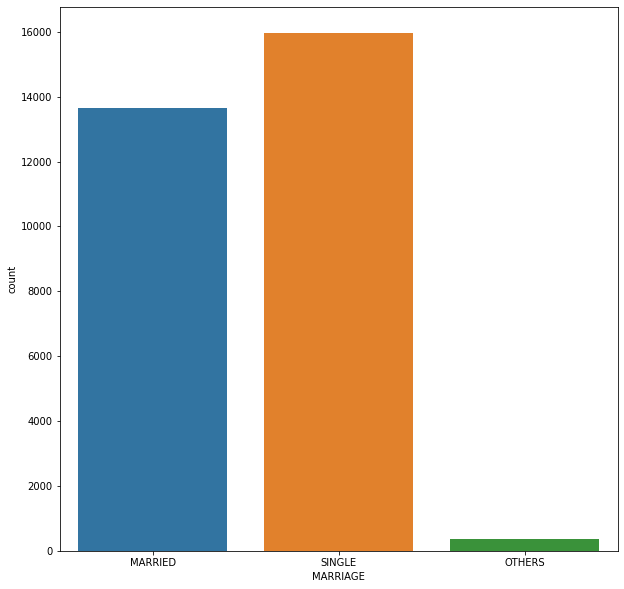

In [16]:
plt.figure(figsize = (10,10))
sns.countplot(x="MARRIAGE", data=credit)

In [17]:
#renaming columns for easier understanding
credit.rename(columns={'PAY_0':'PAY_SEPT','PAY_2':'PAY_AUG','PAY_3':'PAY_JUL','PAY_4':'PAY_JUN','PAY_5':'PAY_MAY','PAY_6':'PAY_APR'},inplace=True)
credit.rename(columns={'BILL_AMT1':'BILL_AMT_SEPT','BILL_AMT2':'BILL_AMT_AUG','BILL_AMT3':'BILL_AMT_JUL','BILL_AMT4':'BILL_AMT_JUN','BILL_AMT5':'BILL_AMT_MAY','BILL_AMT6':'BILL_AMT_APR'}, inplace = True)
credit.rename(columns={'PAY_AMT1':'PAY_AMT_SEPT','PAY_AMT2':'PAY_AMT_AUG','PAY_AMT3':'PAY_AMT_JUL','PAY_AMT4':'PAY_AMT_JUN','PAY_AMT5':'PAY_AMT_MAY','PAY_AMT6':'PAY_AMT_APR'},inplace=True)

In [18]:
credit

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_SEPT,PAY_AUG,PAY_JUL,PAY_JUN,...,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,PAY_AMT_JUL,PAY_AMT_JUN,PAY_AMT_MAY,PAY_AMT_APR,DefaultStatus
0,1,20000,MALE,UNIVERSITY,MARRIED,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,FEMALE,UNIVERSITY,SINGLE,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,FEMALE,UNIVERSITY,SINGLE,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,FEMALE,UNIVERSITY,MARRIED,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,MALE,UNIVERSITY,MARRIED,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,MALE,HIGH_SCHOOL,MARRIED,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,MALE,HIGH_SCHOOL,SINGLE,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,MALE,UNIVERSITY,SINGLE,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,MALE,HIGH_SCHOOL,MARRIED,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


## <u>Data Visualization<u/>

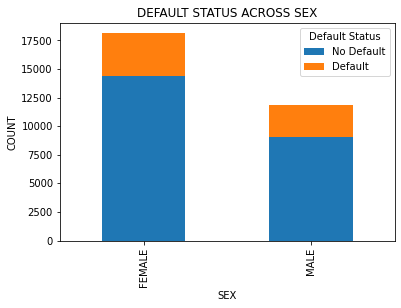

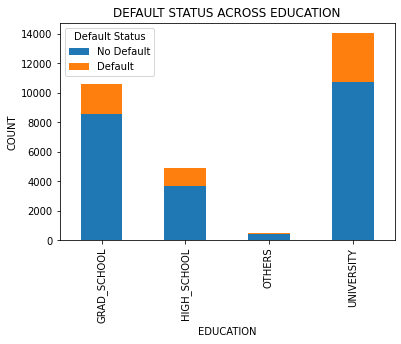

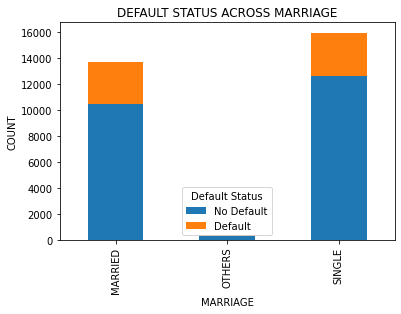

In [19]:
for col in ['SEX', 'EDUCATION', 'MARRIAGE']:
    credit.groupby([col, 'DefaultStatus'])['DefaultStatus'].count().unstack().plot.bar(stacked=True)
    plt.legend(title='Default Status', labels=['No Default', 'Default'])
    plt.title("DEFAULT STATUS ACROSS "+ col)
    plt.ylabel("COUNT")
    plt.show()

<Figure size 720x360 with 0 Axes>

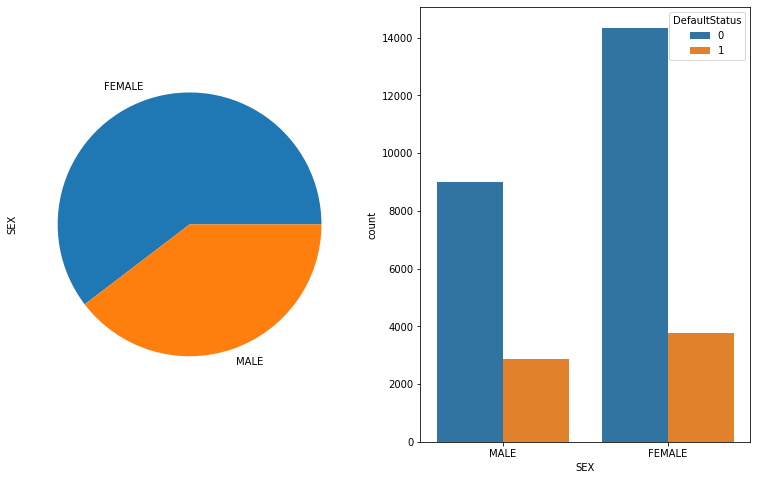

<Figure size 720x360 with 0 Axes>

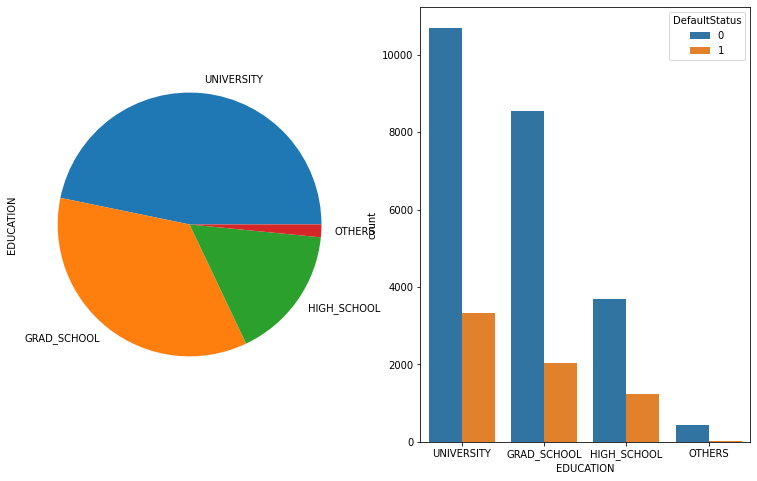

<Figure size 720x360 with 0 Axes>

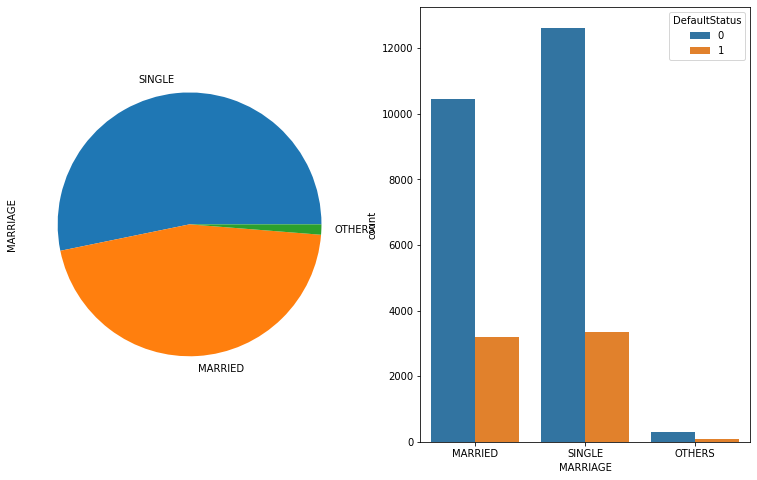

In [20]:
categorical_features = ['SEX','EDUCATION','MARRIAGE']

for col in categorical_features:
  plt.figure(figsize=(10,5))
  fig, axes = plt.subplots(ncols=2,figsize=(13,8))
  credit[col].value_counts().plot(kind="pie",ax = axes[0],subplots=True)
  sns.countplot(x = col, hue = 'DefaultStatus', data = credit)

<h3> Findings </h3>

<ul> 
<li> There are more female credit card defaulters. This could be due to the fact that there are more female credit card holders </li>
<li> There are more defaulters in people with higher education. This could also be due to the fact that there are more educated people in the sampling
</li>
<li> There is roughly the same amount of defaulters within single and married people. However, there are lesser single people represented in the sample. Hence, this could indicate that married couples default more despite having the same proportion.
</li>
</ul>

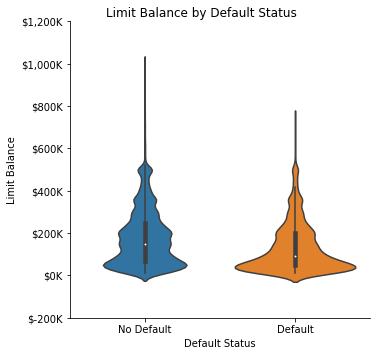

In [21]:
chart= sns.catplot(x='DefaultStatus', y='LIMIT_BAL', data=credit,kind="violin")
ticks = chart.axes[0][0].get_yticks()
ylabels = ['$' + '{:,.0f}'.format(y/1000) + 'K' for y in ticks]
chart.set_yticklabels(ylabels)
chart.set_xticklabels(["No Default","Default"])
chart.fig.suptitle('Limit Balance by Default Status')
chart.set(xlabel='Default Status', ylabel='Limit Balance')
plt.show()

The visualization above suggest that the amount of credit given to individuals that does not default is slightly higher than individuals who default. Additionally, most of the credits given seem to be under $200K.

From the visualizations above, we could see the repayment status in each month with the proportion of default status. In general, it could be observed that the longer the payment has been delayed, the bigger the proportion of default is on next month's repayment. 

<h2> Age Variable </h2>

<AxesSubplot:xlabel='index', ylabel='AGE'>

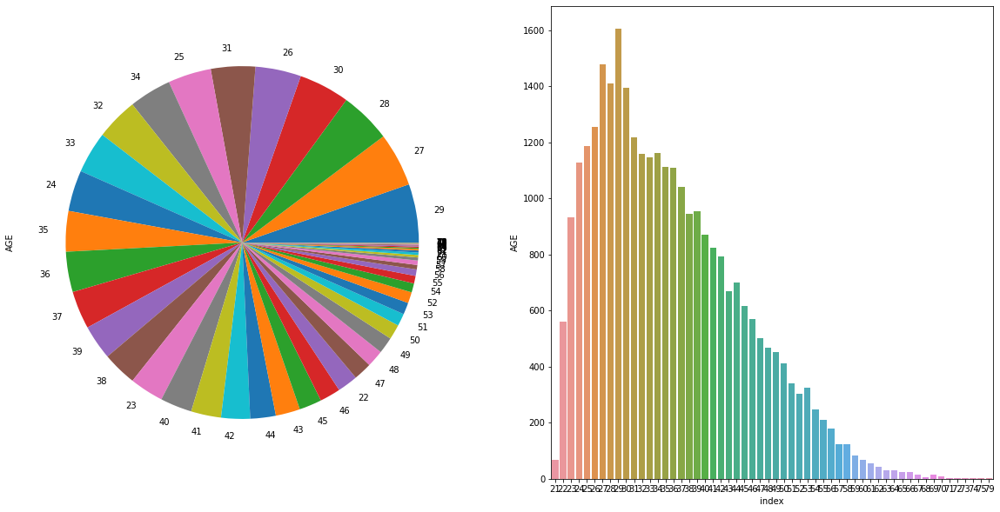

In [22]:
## Viewing the age ranges:
fig, axes = plt.subplots(ncols=2,figsize=(20,10))
Day_df=credit['AGE'].value_counts().reset_index()
credit['AGE'].value_counts().plot(kind="pie",ax = axes[0],subplots=True)
sns.barplot(x='index',y='AGE',data=Day_df,ax = axes[1],orient='v')

<h3> Billing Periods

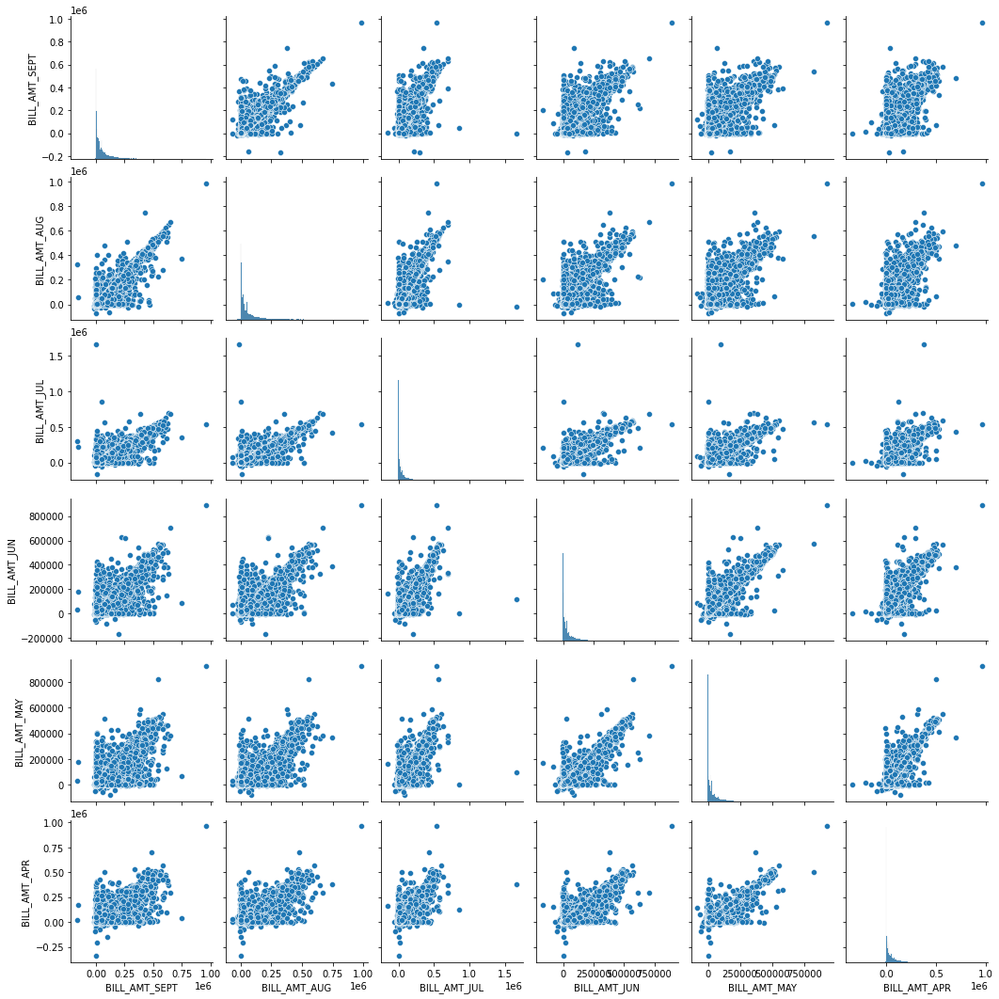

In [23]:
bill_amnt_df = credit[['BILL_AMT_SEPT',	'BILL_AMT_AUG',	'BILL_AMT_JUL',	'BILL_AMT_JUN',	'BILL_AMT_MAY',	'BILL_AMT_APR']]
sns.pairplot(data = bill_amnt_df)

<h3> Running Violing Plots for Default V Limit Bal

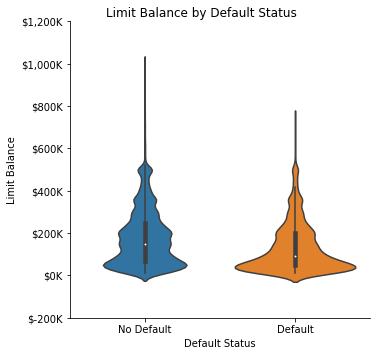

In [24]:
chart = sns.catplot(x="DefaultStatus", y="LIMIT_BAL", data = credit, kind = "violin")
ticks = chart.axes[0][0].get_yticks()
ylabels = ['$' + '{:,.0f}'.format(y/1000) + 'K' for y in ticks]
chart.set_yticklabels(ylabels)
chart.set_xticklabels(["No Default","Default"])
chart.fig.suptitle('Limit Balance by Default Status')
chart.set(xlabel='Default Status', ylabel='Limit Balance')
plt.show()

<h3> History of payment statuses

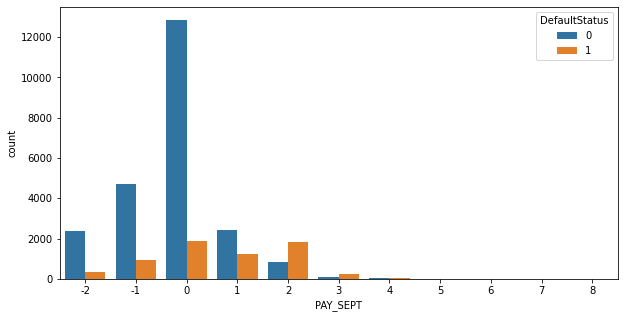

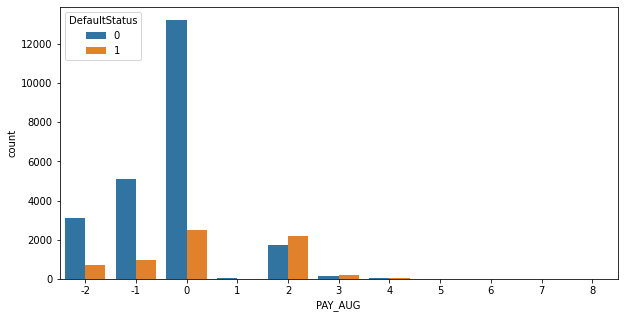

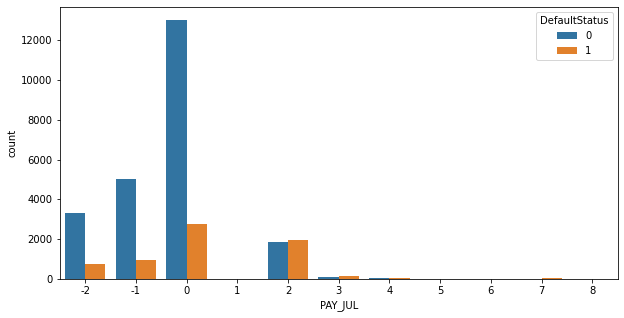

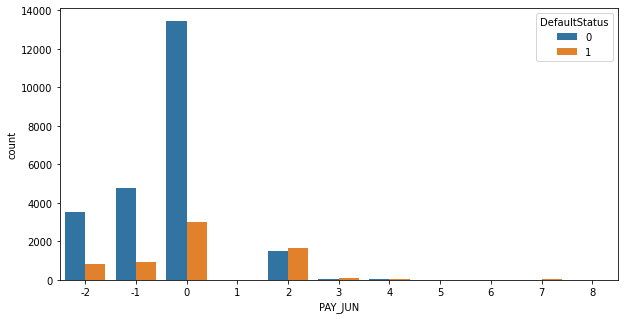

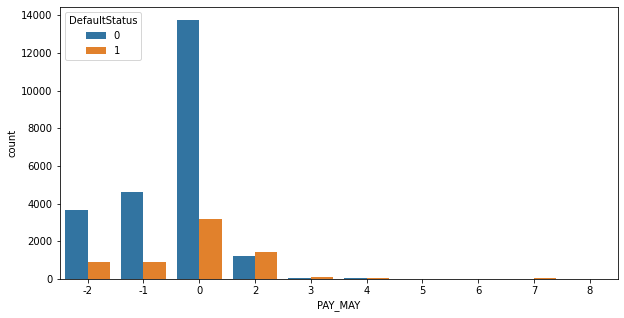

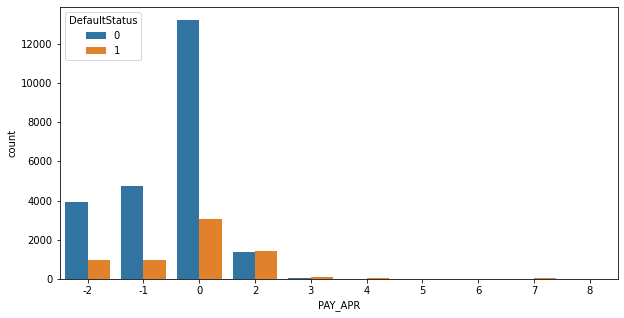

In [25]:
pay_col = ['PAY_SEPT',	'PAY_AUG',	'PAY_JUL',	'PAY_JUN',	'PAY_MAY',	'PAY_APR']
for col in pay_col:
  plt.figure(figsize=(10,5))
  sns.countplot(x = col, hue = 'DefaultStatus', data = credit)

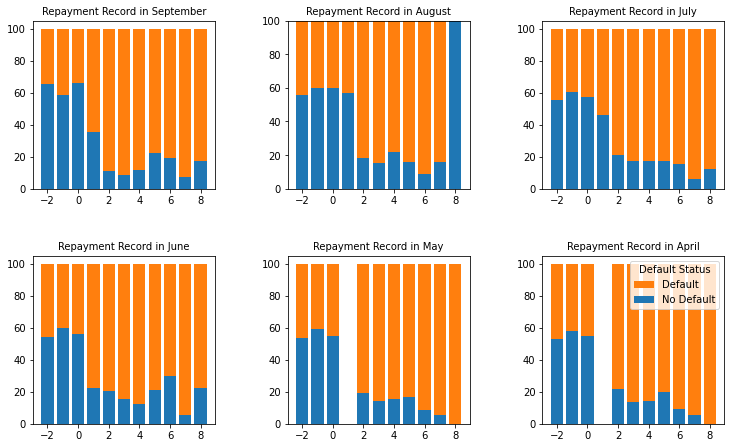

In [26]:
subplot_num = 231
k=0
months = ["September","August","July","June","May","April"]
plt.figure(figsize=(12,7))
for col in ['PAY_SEPT', 'PAY_AUG', 'PAY_JUL', 'PAY_JUN', 'PAY_MAY', 'PAY_APR']:
    ind = sorted(credit[col].unique())
    pay_0 = (credit[col][credit['DefaultStatus'] == 0].value_counts(normalize=True)).sort_index()
    pay_1 = (credit[col][credit['DefaultStatus'] == 1].value_counts(normalize=True)).sort_index()
    for i in pay_0.index:
        if i not in pay_1.index:
            pay_1[i]=0
    for i in pay_1.index:
        if i not in pay_0.index:
            pay_0[i]=0
    total = pay_0.values+pay_1.values
    pay_0_prop = np.true_divide(pay_0, total)*100
    pay_1_prop = np.true_divide(pay_1, total)*100
    plt.subplot(subplot_num)
    subplot_num+=1
    plt.bar(ind, pay_1_prop, bottom=pay_0_prop, label='1',color='tab:orange')
    plt.bar(ind, pay_0_prop, label='0',color='tab:blue')
    plt.title("Repayment Record in "+months[k], fontsize=10)
    k+=1

plt.legend(title='Default Status', labels=['Default', 'No Default'],
           loc="upper right", fontsize=10)
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)
plt.show()

## <u>Data Modelling<u/>

### Data Preparation

In [27]:
convert_dict = {'SEX': "category",
                'EDUCATION': "category",
                'MARRIAGE': "category",
                'PAY_SEPT': "category",
                'PAY_AUG': "category",
                'PAY_JUL': "category",
                'PAY_JUN': "category",
                'PAY_MAY': "category",
                'PAY_APR': "category",
                'DefaultStatus': "category"
                }
credit = credit.astype(convert_dict)

In [28]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   ID             30000 non-null  int64   
 1   LIMIT_BAL      30000 non-null  int64   
 2   SEX            30000 non-null  category
 3   EDUCATION      30000 non-null  category
 4   MARRIAGE       30000 non-null  category
 5   AGE            30000 non-null  int64   
 6   PAY_SEPT       30000 non-null  category
 7   PAY_AUG        30000 non-null  category
 8   PAY_JUL        30000 non-null  category
 9   PAY_JUN        30000 non-null  category
 10  PAY_MAY        30000 non-null  category
 11  PAY_APR        30000 non-null  category
 12  BILL_AMT_SEPT  30000 non-null  int64   
 13  BILL_AMT_AUG   30000 non-null  int64   
 14  BILL_AMT_JUL   30000 non-null  int64   
 15  BILL_AMT_JUN   30000 non-null  int64   
 16  BILL_AMT_MAY   30000 non-null  int64   
 17  BILL_AMT_APR   30000 non-null  

In [29]:
X = credit.drop(columns=['ID', 'DefaultStatus'])
X = pd.get_dummies(X)
Y = credit['DefaultStatus']

In [30]:
from scipy import stats


<h3> Checking for collinearity

In [120]:
#vif to check collinearity 
#1 = not correlated. 
#Between 1 and 5 = moderately correlated. 
#Greater than 5 = highly correlated.
from statsmodels.stats.outliers_influence import variance_inflation_factor 
vif_data = pd.DataFrame() 
vif_data["feature"] = X.columns 
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))] 
print(vif_data)

/usr/local/lib/python3.8/dist-packages/statsmodels/stats/outliers_influence.py:193: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


                  feature         VIF
0               LIMIT_BAL    1.353381
1            PAY_AMT_SEPT         inf
2             PAY_AMT_AUG         inf
3             PAY_AMT_JUL         inf
4             PAY_AMT_JUN         inf
5             PAY_AMT_MAY         inf
6             PAY_AMT_APR         inf
7           TOTAL_PAYMENT         inf
8              SEX_FEMALE         inf
9                SEX_MALE         inf
10  EDUCATION_GRAD_SCHOOL    2.175641
11       EDUCATION_OTHERS    1.086208
12   EDUCATION_UNIVERSITY    2.064900
13            PAY_SEPT_-2   68.544464
14            PAY_SEPT_-1  124.218111
15             PAY_SEPT_0  203.907211
16             PAY_SEPT_1   85.253730
17             PAY_SEPT_2   65.245045
18             PAY_SEPT_3    9.355861
19             PAY_SEPT_4    2.890779
20             PAY_AUG_-2   66.401163
21             PAY_AUG_-1   97.555958
22              PAY_AUG_0  155.581830
23              PAY_AUG_2   67.946764
24              PAY_AUG_3    7.323081
25          

In [31]:
#Normalization
col = ['LIMIT_BAL','AGE','BILL_AMT_SEPT','BILL_AMT_AUG','BILL_AMT_JUL','BILL_AMT_JUN',
       'BILL_AMT_MAY','BILL_AMT_APR','PAY_AMT_SEPT','PAY_AMT_AUG','PAY_AMT_JUL',
       'PAY_AMT_JUN','PAY_AMT_MAY','PAY_AMT_APR']
X[col]=X[col].apply(stats.zscore)
X

,LIMIT_BAL,AGE,BILL_AMT_SEPT,BILL_AMT_AUG,BILL_AMT_JUL,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,...,PAY_APR_-2,PAY_APR_-1,PAY_APR_0,PAY_APR_2,PAY_APR_3,PAY_APR_4,PAY_APR_5,PAY_APR_6,PAY_APR_7,PAY_APR_8
0,-1.136720,-1.246020,-0.642501,-0.647399,-0.667993,-0.672497,-0.663059,-0.652724,-0.341942,-0.227086,...,1,0,0,0,0,0,0,0,0,0
1,-0.365981,-1.029047,-0.659219,-0.666747,-0.639254,-0.621636,-0.606229,-0.597966,-0.341942,-0.213588,...,0,0,0,1,0,0,0,0,0,0
2,-0.597202,-0.161156,-0.298560,-0.493899,-0.482408,-0.449730,-0.417188,-0.391630,-0.250292,-0.191887,...,0,0,1,0,0,0,0,0,0,0
3,-0.905498,0.164303,-0.057491,-0.013293,0.032846,-0.232373,-0.186729,-0.156579,-0.221191,-0.169361,...,0,0,1,0,0,0,0,0,0,0
4,-0.905498,2.334029,-0.578618,-0.611318,-0.161189,-0.346997,-0.348137,-0.331482,-0.221191,1.335034,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,0.404759,0.381275,1.870379,2.018136,2.326690,0.695474,-0.149259,-0.384392,0.171250,0.611048,...,0,0,1,0,0,0,0,0,0,0
29996,-0.134759,0.815221,-0.672786,-0.665299,-0.627430,-0.532924,-0.577691,-0.652724,-0.231032,-0.103955,...,0,0,1,0,0,0,0,0,0,0
29997,-1.059646,0.164303,-0.647227,-0.643830,-0.638158,-0.347961,-0.324517,-0.327687,-0.341942,-0.256990,...,0,0,1,0,0,0,0,0,0,0
29998,-0.674276,0.598248,-0.717982,0.410269,0.422373,0.147844,-0.468063,0.169130,4.844316,-0.109033,...,0,1,0,0,0,0,0,0,0,0


In [32]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [33]:
X_train,X_test,Y_train,Y_test =  train_test_split(X,Y,random_state=42)

In [34]:
#oversampling using SMOTE due to imbalanced dataset
from imblearn.over_sampling import SMOTE
X_train, Y_train = SMOTE(random_state = 42).fit_resample(X_train, Y_train)

In [35]:
Y_train.value_counts()

0    17491
1    17491
Name: DefaultStatus, dtype: int64

### Logistic Regression

In [36]:
from sklearn import linear_model

In [37]:
model = linear_model.LogisticRegression(random_state = 42)

In [38]:
model.fit(X_train,Y_train)
pred = model.predict(X_test)
cm = confusion_matrix(Y_test,pred)
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

Accuracy : 0.8017333333333333
Precision:  0.5509461426491994
Recall:  0.46527350952673635


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [39]:
from sklearn.metrics import plot_roc_curve,plot_precision_recall_curve

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Text(0.5, 1.0, 'Precision Recall Curve')

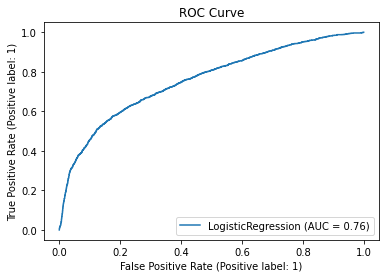

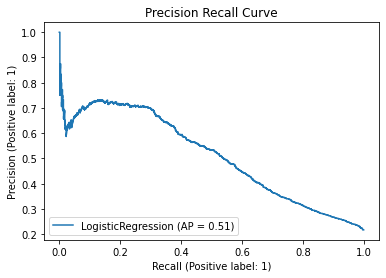

In [40]:
plot_roc_curve(model,X_test,Y_test)
plt.title("ROC Curve")
plot_precision_recall_curve(model,X_test,Y_test)
plt.title("Precision Recall Curve")

The recall-precision graph shows that by increasing the recall (reducing false negative), there is reduction in precision (increase in false positive). However, in this particular case, reducing false negative is more important than reducing false positive because we don't want to give out loan to people who will default.

### Decision Tree

In [41]:
from sklearn import tree

In [42]:
model = tree.DecisionTreeClassifier(random_state = 42)

In [43]:
model.fit(X_train,Y_train)
pred = model.predict(X_test)
cm = confusion_matrix(Y_test,pred)
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

Accuracy : 0.6989333333333333
Precision:  0.3496903287279657
Recall:  0.45113706207744314


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Text(0.5, 1.0, 'Precision Recall Curve')

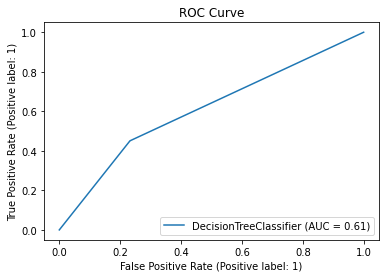

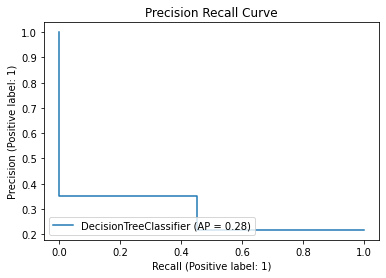

In [44]:
plot_roc_curve(model,X_test,Y_test)
plt.title("ROC Curve")
plot_precision_recall_curve(model,X_test,Y_test)
plt.title("Precision Recall Curve")

<h3> Visualizing the tree

In [45]:
import graphviz
tree_data = tree.export_graphviz(model,out_file = None, filled = True, rounded=True)
graph = graphviz.Source(tree_data)
graph

### Random Forest

In [46]:
from sklearn import ensemble

In [47]:
model = ensemble.RandomForestClassifier(random_state = 42)

In [48]:
model.fit(X_train,Y_train)
pred = model.predict(X_test)
cm = confusion_matrix(Y_test,pred)
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

Accuracy : 0.7942666666666667
Precision:  0.5287671232876713
Recall:  0.47449293177627533


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Text(0.5, 1.0, 'Precision Recall Curve')

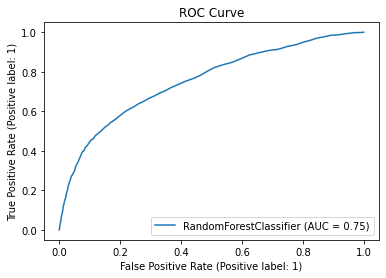

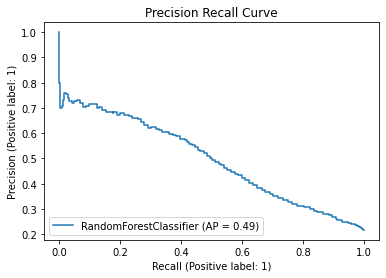

In [49]:
plot_roc_curve(model,X_test,Y_test)
plt.title("ROC Curve")
plot_precision_recall_curve(model,X_test,Y_test)
plt.title("Precision Recall Curve")

### XGBoost

In [50]:
model = ensemble.GradientBoostingClassifier(random_state = 42)

In [51]:
model.fit(X_train,Y_train)
pred = model.predict(X_test)
cm = confusion_matrix(Y_test,pred)
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

Accuracy : 0.7801333333333333
Precision:  0.49373576309794986
Recall:  0.5328826060233559


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Text(0.5, 1.0, 'Precision Recall Curve')

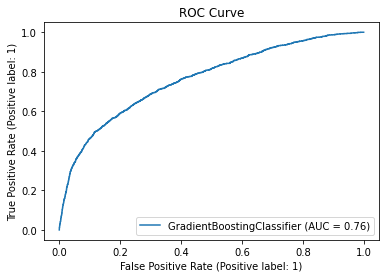

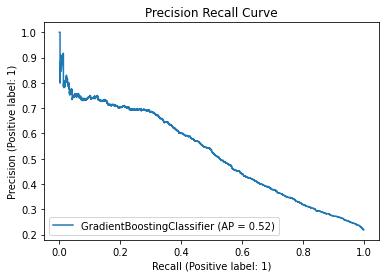

In [52]:
plot_roc_curve(model,X_test,Y_test)
plt.title("ROC Curve")
plot_precision_recall_curve(model,X_test,Y_test)
plt.title("Precision Recall Curve")

### Neural Network with sklearn

In [53]:
from sklearn import neural_network

In [54]:
model = neural_network.MLPClassifier(random_state=42)

In [55]:
model.fit(X_train,Y_train)
pred = model.predict(X_test)
cm = confusion_matrix(Y_test,pred)
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

Accuracy : 0.7446666666666667
Precision:  0.42835820895522386
Recall:  0.5291948371235402


/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Text(0.5, 1.0, 'Precision Recall Curve')

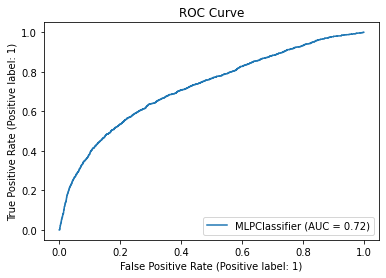

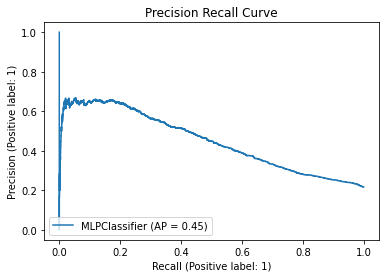

In [56]:
plot_roc_curve(model,X_test,Y_test)
plt.title("ROC Curve")
plot_precision_recall_curve(model,X_test,Y_test)
plt.title("Precision Recall Curve")

### Neural Network with Keras and Tensorflow

In [57]:
import random
random.seed(1)
import numpy as np
np.random.seed(1)
import tensorflow as tf
tf.random.set_seed(1)
from keras.models import Sequential
from keras.layers import Dense,Dropout

In [58]:
model = Sequential()

In [59]:
X

,LIMIT_BAL,AGE,BILL_AMT_SEPT,BILL_AMT_AUG,BILL_AMT_JUL,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,...,PAY_APR_-2,PAY_APR_-1,PAY_APR_0,PAY_APR_2,PAY_APR_3,PAY_APR_4,PAY_APR_5,PAY_APR_6,PAY_APR_7,PAY_APR_8
0,-1.136720,-1.246020,-0.642501,-0.647399,-0.667993,-0.672497,-0.663059,-0.652724,-0.341942,-0.227086,...,1,0,0,0,0,0,0,0,0,0
1,-0.365981,-1.029047,-0.659219,-0.666747,-0.639254,-0.621636,-0.606229,-0.597966,-0.341942,-0.213588,...,0,0,0,1,0,0,0,0,0,0
2,-0.597202,-0.161156,-0.298560,-0.493899,-0.482408,-0.449730,-0.417188,-0.391630,-0.250292,-0.191887,...,0,0,1,0,0,0,0,0,0,0
3,-0.905498,0.164303,-0.057491,-0.013293,0.032846,-0.232373,-0.186729,-0.156579,-0.221191,-0.169361,...,0,0,1,0,0,0,0,0,0,0
4,-0.905498,2.334029,-0.578618,-0.611318,-0.161189,-0.346997,-0.348137,-0.331482,-0.221191,1.335034,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,0.404759,0.381275,1.870379,2.018136,2.326690,0.695474,-0.149259,-0.384392,0.171250,0.611048,...,0,0,1,0,0,0,0,0,0,0
29996,-0.134759,0.815221,-0.672786,-0.665299,-0.627430,-0.532924,-0.577691,-0.652724,-0.231032,-0.103955,...,0,0,1,0,0,0,0,0,0,0
29997,-1.059646,0.164303,-0.647227,-0.643830,-0.638158,-0.347961,-0.324517,-0.327687,-0.341942,-0.256990,...,0,0,1,0,0,0,0,0,0,0
29998,-0.674276,0.598248,-0.717982,0.410269,0.422373,0.147844,-0.468063,0.169130,4.844316,-0.109033,...,0,1,0,0,0,0,0,0,0,0


In [60]:
#input layer
model.add(Dense(58,input_dim=87,activation="relu"))
model.add(Dropout(0.1))

In [61]:
#next layer
model.add(Dense(58,activation="relu"))
model.add(Dropout(0.1))

In [62]:
#output layer
model.add(Dense(1,activation="sigmoid"))

In [63]:
b = 5

In [64]:
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=["accuracy"])
h = model.fit(X_train,Y_train,batch_size=b,epochs=20)

Epoch 1/20
6997/6997 [==============================] - 17s 2ms/step - loss: 0.5489 - accuracy: 0.7202
Epoch 2/20
6997/6997 [==============================] - 16s 2ms/step - loss: 0.5037 - accuracy: 0.7532
Epoch 3/20
6997/6997 [==============================] - 16s 2ms/step - loss: 0.4727 - accuracy: 0.7699
Epoch 4/20
6997/6997 [==============================] - 17s 2ms/step - loss: 0.4570 - accuracy: 0.7770
Epoch 5/20
6997/6997 [==============================] - 18s 3ms/step - loss: 0.4418 - accuracy: 0.7839
Epoch 6/20
6997/6997 [==============================] - 22s 3ms/step - loss: 0.4336 - accuracy: 0.7887
Epoch 7/20
6997/6997 [==============================] - 16s 2ms/step - loss: 0.4283 - accuracy: 0.7908
Epoch 8/20
6997/6997 [==============================] - 17s 2ms/step - loss: 0.4230 - accuracy: 0.7922
Epoch 9/20
6997/6997 [==============================] - 19s 3ms/step - loss: 0.4203 - accuracy: 0.7936
Epoch 10/20
6997/6997 [==============================] - 16s 2ms/step - l

Text(0.5, 1.0, 'Accuracy')

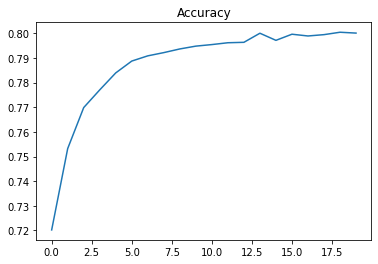

In [65]:
plt.plot(h.history["accuracy"])
plt.title("Accuracy")

Text(0.5, 1.0, 'Loss')

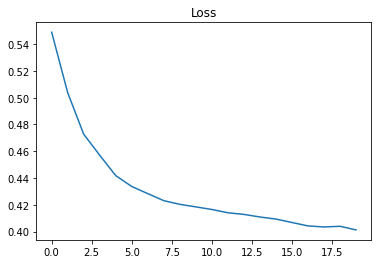

In [66]:
plt.plot(h.history["loss"])
plt.title("Loss")

In [67]:
pred = model.predict(X_test)
pred = pred > 0.5
pred = pred.astype("int32")

235/235 [==============================] - 0s 1ms/step


In [68]:
cm = confusion_matrix(Y_test,pred)
cm

array([[5074,  799],
       [ 835,  792]])

<AxesSubplot:>

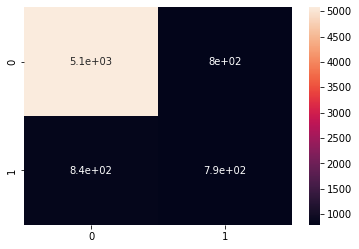

In [69]:
sns.heatmap(cm,annot=True)

In [70]:
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

Accuracy : 0.7821333333333333
Precision:  0.49780012570710247
Recall:  0.48678549477566074


In [71]:
model.evaluate(X_test,Y_test)

235/235 [==============================] - 1s 3ms/step - loss: 0.5366 - accuracy: 0.7821


[0.5366354584693909, 0.7821333408355713]

From our initial data analysis, the best performing model seem to be XGBoost. Despite having slightly lower accuracy than logistic regression at 0.7887, it has significantly higher precision. In this case, reducing false negative (people who were predicted to not default but actually defaulted) is more important than reducing false positive.

# Improvement Approach

Improvements of the result could be achieved through the following 3 ways:
1. Feature engineering
2. Feature selection
3. Hyperparameter tuning

## <u>Feature Engineering<u/>

In [72]:
credit['TOTAL_PAYMENT'] = credit['PAY_AMT_SEPT'] + credit['PAY_AMT_AUG'] + credit['PAY_AMT_JUL'] + credit['PAY_AMT_JUN'] + credit['PAY_AMT_MAY'] + credit['PAY_AMT_APR']

In [73]:
credit.groupby("DefaultStatus")["TOTAL_PAYMENT"].mean()

DefaultStatus
0    34969.420647
1    19969.293701
Name: TOTAL_PAYMENT, dtype: float64

<Figure size 720x720 with 0 Axes>

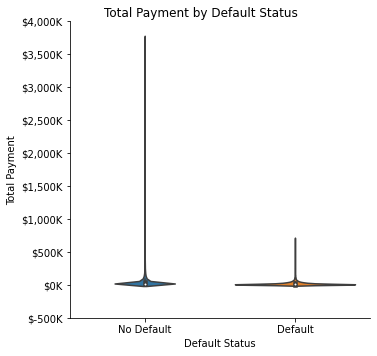

In [74]:
plt.figure(figsize=(10,10))
chart= sns.catplot(x='DefaultStatus', y='TOTAL_PAYMENT', data=credit,kind="violin")
ticks = chart.axes[0][0].get_yticks()
ylabels = ['$' + '{:,.0f}'.format(y/1000) + 'K' for y in ticks]
chart.set_yticklabels(ylabels)
chart.set_xticklabels(["No Default","Default"])
chart.fig.suptitle('Total Payment by Default Status')
chart.set(xlabel='Default Status', ylabel='Total Payment')
plt.show()

This showcases that the default total payment among people who don't default is higher than those who defaulted.

In [ ]:
credit['AMT_DUE'] = (credit['BILL_AMT_APR']+credit['BILL_AMT_MAY']+credit['BILL_AMT_JUN']+credit['BILL_AMT_JUL']+credit['BILL_AMT_SEPT'])-credit['TOTAL_PAYMENT']

In [76]:
credit.groupby("DefaultStatus")["AMT_DUE"].mean()

DefaultStatus
0    187742.051532
1    193570.044002
Name: AMT_DUE, dtype: float64

<Figure size 720x720 with 0 Axes>

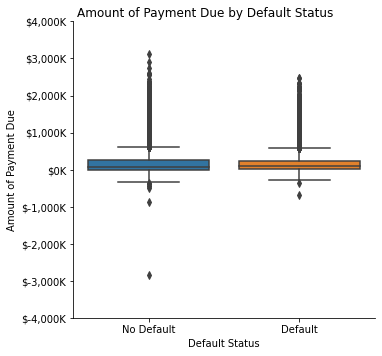

In [77]:
plt.figure(figsize=(10,10))
chart= sns.catplot(x='DefaultStatus', y='AMT_DUE', data=credit,kind="box")
ticks = chart.axes[0][0].get_yticks()
ylabels = ['$' + '{:,.0f}'.format(y/1000) + 'K' for y in ticks]
chart.set_yticklabels(ylabels)
chart.set_xticklabels(["No Default","Default"])
chart.fig.suptitle('Amount of Payment Due by Default Status')
chart.set(xlabel='Default Status', ylabel='Amount of Payment Due')
plt.show()

The chart suggest that the amount of payment due is higher among those who default. Furthermore, people who don't default seem to pay ahead of schedule, resulting in some having negative payment due.

## <u>Feature Selection<u/>

Some of the key benefits of performing feature selection are:
1. Reduction of overfitting
2. Possible improvement in accuracy
3. Reduction of training time

In [78]:
X = credit.drop(columns=['ID', 'DefaultStatus'])
X = pd.get_dummies(X)
Y = credit['DefaultStatus']

In [79]:
#Normalization
col = ['LIMIT_BAL','AGE','BILL_AMT_SEPT','BILL_AMT_AUG','BILL_AMT_JUL','BILL_AMT_JUN',
       'BILL_AMT_MAY','BILL_AMT_APR','PAY_AMT_SEPT','PAY_AMT_AUG','PAY_AMT_JUL',
       'PAY_AMT_JUN','PAY_AMT_MAY','PAY_AMT_APR']
X[col]=X[col].apply(stats.zscore)
X

,LIMIT_BAL,AGE,BILL_AMT_SEPT,BILL_AMT_AUG,BILL_AMT_JUL,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,...,PAY_APR_-2,PAY_APR_-1,PAY_APR_0,PAY_APR_2,PAY_APR_3,PAY_APR_4,PAY_APR_5,PAY_APR_6,PAY_APR_7,PAY_APR_8
0,-1.136720,-1.246020,-0.642501,-0.647399,-0.667993,-0.672497,-0.663059,-0.652724,-0.341942,-0.227086,...,1,0,0,0,0,0,0,0,0,0
1,-0.365981,-1.029047,-0.659219,-0.666747,-0.639254,-0.621636,-0.606229,-0.597966,-0.341942,-0.213588,...,0,0,0,1,0,0,0,0,0,0
2,-0.597202,-0.161156,-0.298560,-0.493899,-0.482408,-0.449730,-0.417188,-0.391630,-0.250292,-0.191887,...,0,0,1,0,0,0,0,0,0,0
3,-0.905498,0.164303,-0.057491,-0.013293,0.032846,-0.232373,-0.186729,-0.156579,-0.221191,-0.169361,...,0,0,1,0,0,0,0,0,0,0
4,-0.905498,2.334029,-0.578618,-0.611318,-0.161189,-0.346997,-0.348137,-0.331482,-0.221191,1.335034,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,0.404759,0.381275,1.870379,2.018136,2.326690,0.695474,-0.149259,-0.384392,0.171250,0.611048,...,0,0,1,0,0,0,0,0,0,0
29996,-0.134759,0.815221,-0.672786,-0.665299,-0.627430,-0.532924,-0.577691,-0.652724,-0.231032,-0.103955,...,0,0,1,0,0,0,0,0,0,0
29997,-1.059646,0.164303,-0.647227,-0.643830,-0.638158,-0.347961,-0.324517,-0.327687,-0.341942,-0.256990,...,0,0,1,0,0,0,0,0,0,0
29998,-0.674276,0.598248,-0.717982,0.410269,0.422373,0.147844,-0.468063,0.169130,4.844316,-0.109033,...,0,1,0,0,0,0,0,0,0,0


In [80]:
#Select k best
from sklearn.feature_selection import f_regression,SelectKBest

In [81]:
f = SelectKBest(score_func=f_regression,k=50)
f = f.fit(X,Y).get_support()
X.columns[f]

Index(['LIMIT_BAL', 'PAY_AMT_SEPT', 'PAY_AMT_AUG', 'PAY_AMT_JUL',
       'PAY_AMT_JUN', 'PAY_AMT_MAY', 'PAY_AMT_APR', 'TOTAL_PAYMENT',
       'SEX_FEMALE', 'SEX_MALE', 'EDUCATION_GRAD_SCHOOL', 'EDUCATION_OTHERS',
       'EDUCATION_UNIVERSITY', 'PAY_SEPT_-2', 'PAY_SEPT_-1', 'PAY_SEPT_0',
       'PAY_SEPT_1', 'PAY_SEPT_2', 'PAY_SEPT_3', 'PAY_SEPT_4', 'PAY_AUG_-2',
       'PAY_AUG_-1', 'PAY_AUG_0', 'PAY_AUG_2', 'PAY_AUG_3', 'PAY_AUG_4',
       'PAY_JUL_-1', 'PAY_JUL_0', 'PAY_JUL_2', 'PAY_JUL_3', 'PAY_JUL_4',
       'PAY_JUL_7', 'PAY_JUN_-1', 'PAY_JUN_0', 'PAY_JUN_2', 'PAY_JUN_3',
       'PAY_JUN_4', 'PAY_JUN_7', 'PAY_MAY_-1', 'PAY_MAY_0', 'PAY_MAY_2',
       'PAY_MAY_3', 'PAY_MAY_4', 'PAY_MAY_7', 'PAY_APR_-1', 'PAY_APR_0',
       'PAY_APR_2', 'PAY_APR_3', 'PAY_APR_4', 'PAY_APR_7'],
      dtype='object')

In [82]:
X = X.loc[:,['LIMIT_BAL', 'PAY_AMT_SEPT', 'PAY_AMT_AUG', 'PAY_AMT_JUL',
       'PAY_AMT_JUN', 'PAY_AMT_MAY', 'PAY_AMT_APR', 'TOTAL_PAYMENT',
       'SEX_FEMALE', 'SEX_MALE', 'EDUCATION_GRAD_SCHOOL', 'EDUCATION_OTHERS',
       'EDUCATION_UNIVERSITY', 'PAY_SEPT_-2', 'PAY_SEPT_-1', 'PAY_SEPT_0',
       'PAY_SEPT_1', 'PAY_SEPT_2', 'PAY_SEPT_3', 'PAY_SEPT_4', 'PAY_AUG_-2',
       'PAY_AUG_-1', 'PAY_AUG_0', 'PAY_AUG_2', 'PAY_AUG_3', 'PAY_AUG_4',
       'PAY_JUL_-1', 'PAY_JUL_0', 'PAY_JUL_2', 'PAY_JUL_3', 'PAY_JUL_4',
       'PAY_JUL_7', 'PAY_JUN_-1', 'PAY_JUN_0', 'PAY_JUN_2', 'PAY_JUN_3',
       'PAY_JUN_4', 'PAY_JUN_7', 'PAY_MAY_-1', 'PAY_MAY_0', 'PAY_MAY_2',
       'PAY_MAY_3', 'PAY_MAY_4', 'PAY_MAY_7', 'PAY_APR_-1', 'PAY_APR_0',
       'PAY_APR_2', 'PAY_APR_3', 'PAY_APR_4', 'PAY_APR_7']]

In [83]:
X_train,X_test,Y_train,Y_test =  train_test_split(X,Y,random_state=42)

In [84]:
#oversampling using SMOTE due to imbalanced dataset
from imblearn.over_sampling import SMOTE
X_train, Y_train = SMOTE(random_state = 42).fit_resample(X_train, Y_train)

## <u>Hyperparameter Tuning<u/>
Hyperparameter tuning can only be done on keras neural network model. In sklearn, the default settings produced the strongest result.

### Logistic Regression

In [85]:
model = linear_model.LogisticRegression(random_state = 42)

In [86]:
model.fit(X_train,Y_train)
pred = model.predict(X_test)
cm = confusion_matrix(Y_test,pred)
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

Accuracy : 0.782
Precision:  0.46923076923076923
Recall:  0.037492317148125384


In [87]:
cm

array([[5804,   69],
       [1566,   61]])

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Text(0.5, 1.0, 'Precision Recall Curve')

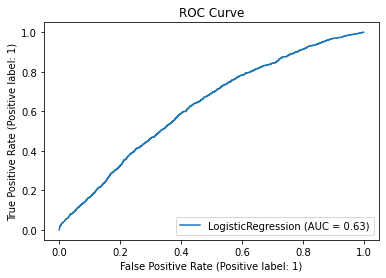

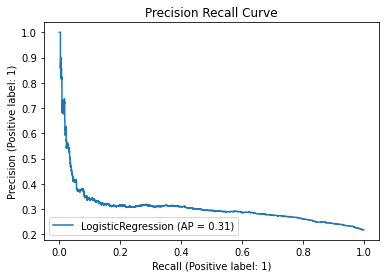

In [88]:
plot_roc_curve(model,X_test,Y_test)
plt.title("ROC Curve")
plot_precision_recall_curve(model,X_test,Y_test)
plt.title("Precision Recall Curve")

### Decision Tree

In [122]:
model = tree.DecisionTreeClassifier(random_state = 42)

In [123]:
model.fit(X_train,Y_train)
pred = model.predict(X_test)
cm = confusion_matrix(Y_test,pred)
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

Accuracy : 0.7248
Precision:  0.3813145029875068
Recall:  0.43146896127842654


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Text(0.5, 1.0, 'Precision Recall Curve')

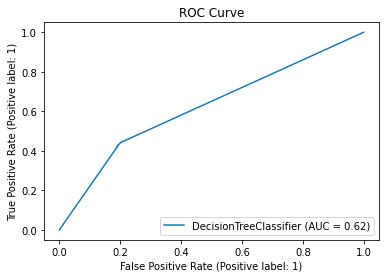

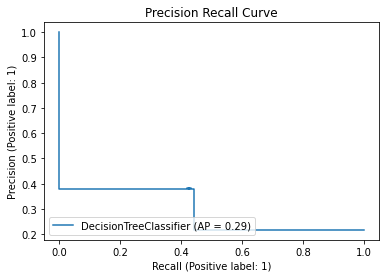

In [124]:
plot_roc_curve(model,X_test,Y_test)
plt.title("ROC Curve")
plot_precision_recall_curve(model,X_test,Y_test)
plt.title("Precision Recall Curve")

In [125]:
fr = model.feature_importances_
print(fr)

[6.55985779e-02 4.30460128e-02 4.65367259e-02 5.07032055e-02
 3.81770033e-02 4.14281762e-02 4.30714337e-02 8.52928140e-02
 1.21097931e-02 3.33549659e-02 9.19464793e-03 2.08474058e-03
 8.67919335e-03 5.90313521e-03 2.75514118e-02 1.69008620e-01
 2.96669059e-02 9.21801248e-03 9.11282031e-04 3.02894332e-04
 8.46086044e-02 1.12205569e-01 6.50754467e-03 5.08527769e-03
 1.66348773e-03 8.23014457e-04 1.98000663e-03 2.72955040e-03
 2.64088622e-03 6.99589436e-04 4.49929655e-04 1.14083165e-04
 1.25465694e-02 1.40463140e-02 9.66247588e-03 5.23103500e-04
 1.25990998e-04 1.32287271e-04 1.76903637e-03 5.75072525e-03
 2.16017917e-03 1.73085247e-04 2.32471356e-05 7.62982911e-05
 3.97630670e-03 3.99985857e-03 2.56929713e-03 5.92678965e-04
 5.18469389e-04 6.98168844e-06]


In [126]:
plt.subplots(figsize=(20,10))
tree.plot_tree(model,fontsize=10)

[Text(0.5675266855483427, 0.9857142857142858, 'X[15] <= 0.5\ngini = 0.5\nsamples = 34982\nvalue = [17491, 17491]'),
 Text(0.3741453465305072, 0.9571428571428572, 'X[21] <= 0.5\ngini = 0.454\nsamples = 22567\nvalue = [7871, 14696]'),
 Text(0.2613999411850457, 0.9285714285714286, 'X[20] <= 0.5\ngini = 0.367\nsamples = 17824\nvalue = [4316, 13508]'),
 Text(0.18182292297422864, 0.9, 'X[14] <= 0.5\ngini = 0.243\nsamples = 14282\nvalue = [2021, 12261]'),
 Text(0.11478616203026974, 0.8714285714285714, 'X[16] <= 0.5\ngini = 0.192\nsamples = 13307\nvalue = [1431, 11876]'),
 Text(0.05083714133522436, 0.8428571428571429, 'X[17] <= 0.5\ngini = 0.108\nsamples = 11536\nvalue = [664, 10872]'),
 Text(0.015461004812222711, 0.8142857142857143, 'X[18] <= 0.5\ngini = 0.022\nsamples = 8277\nvalue = [92, 8185]'),
 Text(0.008065660336300639, 0.7857142857142857, 'X[25] <= 0.5\ngini = 0.008\nsamples = 7878\nvalue = [33, 7845]'),
 Text(0.005493746953575706, 0.7571428571428571, 'X[47] <= 0.5\ngini = 0.006\nsampl

Error in callback <function flush_figures at 0x7f7c8cd2de50> (for post_execute):


KeyboardInterrupt: ignored

<h3> Pruning The Tree

In [129]:
path = model.cost_complexity_pruning_path(X_train,Y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities 
print(ccp_alphas, impurities)

[0.         0.         0.         ... 0.04161601 0.0551362  0.08312942] [0.00813501 0.00813501 0.00813501 ... 0.36173438 0.41687058 0.5       ]


In [133]:
## To find the optimal CP value for the CART Tree. 
## WARNING: following code takes a while to run, so might have to be patient.
for i in path.ccp_alphas: 
  print(i) 
  model = tree.DecisionTreeClassifier(ccp_alpha=i) 
  model.fit(X_train, Y_train) 
  pred = model.predict(X_test) 
  rmse = mean_squared_error(Y_test, pred) ** 0.5 
  cm = confusion_matrix(Y_test, pred)
  print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
  print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
  print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))
  print("RMSE is : ", rmse) 
  print("====")






Streaming output truncated to the last 5000 lines.
RMSE is :  0.49906579392567735
====
4.6777303652267924e-05
Accuracy : 0.7482666666666666
Precision:  0.4200857317819963
Recall:  0.42163491087891825
RMSE is :  0.5017303392593807
====
4.6777303652267924e-05
Accuracy : 0.7476
Precision:  0.41919805589307413
Recall:  0.4240934234787953
RMSE is :  0.5023942674832188
====
4.67906305194053e-05
Accuracy : 0.75
Precision:  0.4242979242979243
Recall:  0.4271665642286417
RMSE is :  0.5
====
4.680978789091534e-05
Accuracy : 0.7481333333333333
Precision:  0.4206060606060606
Recall:  0.4265519360786724
RMSE is :  0.5018631951704235
====
4.6910572323641926e-05
Accuracy : 0.7476
Precision:  0.41978287092882993
Recall:  0.42778119237861095
RMSE is :  0.5023942674832188
====
4.695477017648229e-05
Accuracy : 0.7476
Precision:  0.41978287092882993
Recall:  0.42778119237861095
RMSE is :  0.5023942674832188
====
4.714660969704251e-05
Accuracy : 0.7492
Precision:  0.4225609756097561
Recall:  0.425937307928

<ipython-input-133-dce51fa02773>:9: RuntimeWarning: invalid value encountered in long_scalars
  print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))


<h3> Using GridSearchCV to further optimize the tree

In [128]:
from sklearn.model_selection import GridSearchCV 
model = tree.DecisionTreeClassifier() 
grid = GridSearchCV(estimator = model, param_grid = dict(max_depth = [i for i in range(1, 20)]),cv=10) 
grid = grid.fit(X_train, Y_train) 
pred = grid.predict(X_test)
cm = confusion_matrix(Y_test, pred)
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))



KeyboardInterrupt: ignored

### Random Forest

In [92]:
model = ensemble.RandomForestClassifier(random_state = 42)

In [93]:
model.fit(X_train,Y_train)
pred = model.predict(X_test)
cm = confusion_matrix(Y_test,pred)
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

Accuracy : 0.8053333333333333
Precision:  0.5733099209833187
Recall:  0.4013521819299324


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Text(0.5, 1.0, 'Precision Recall Curve')

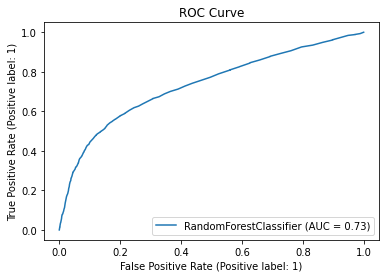

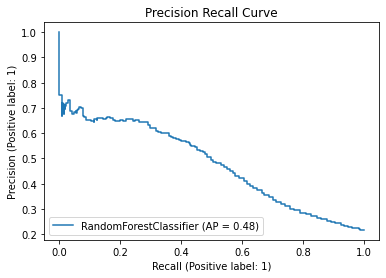

In [94]:
plot_roc_curve(model,X_test,Y_test)
plt.title("ROC Curve")
plot_precision_recall_curve(model,X_test,Y_test)
plt.title("Precision Recall Curve")

### XGBoost

In [95]:
model = ensemble.GradientBoostingClassifier(random_state = 42)

In [96]:
model.fit(X_train,Y_train)
pred = model.predict(X_test)
cm = confusion_matrix(Y_test,pred)
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

Accuracy : 0.8064
Precision:  0.569060773480663
Recall:  0.44314689612784264


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Text(0.5, 1.0, 'Precision Recall Curve')

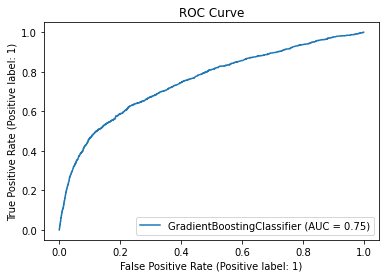

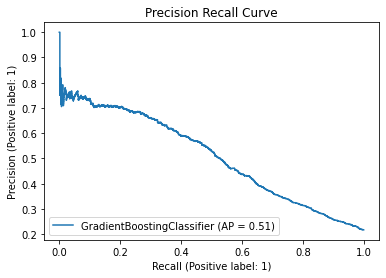

In [97]:
plot_roc_curve(model,X_test,Y_test)
plt.title("ROC Curve")
plot_precision_recall_curve(model,X_test,Y_test)
plt.title("Precision Recall Curve")

### Neural Network with sklearn

In [98]:
model = neural_network.MLPClassifier(random_state=42)

In [99]:
model.fit(X_train,Y_train)
pred = model.predict(X_test)
cm = confusion_matrix(Y_test,pred)
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

Accuracy : 0.7990666666666667
Precision:  0.5638297872340425
Recall:  0.3257529194837124


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Text(0.5, 1.0, 'Precision Recall Curve')

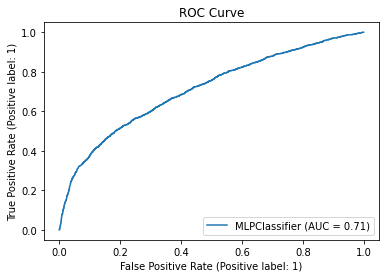

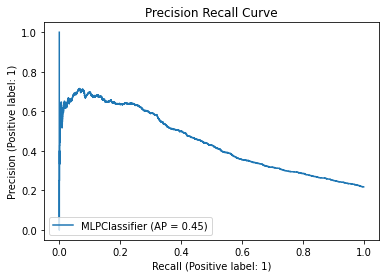

In [100]:
plot_roc_curve(model,X_test,Y_test)
plt.title("ROC Curve")
plot_precision_recall_curve(model,X_test,Y_test)
plt.title("Precision Recall Curve")

### Neural Network with Keras and Tensorflow

In [101]:
import random
random.seed(1)
import numpy as np
np.random.seed(1)
import tensorflow as tf
tf.random.set_seed(1)
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense,Dropout

In [102]:
model = Sequential()

In [103]:
#input layer
model.add(Dense(33,input_dim=50,activation="relu"))
model.add(Dropout(0.1))

#next layer
model.add(Dense(33,activation="relu"))
model.add(Dropout(0.1))

#output layer
model.add(Dense(1,activation="sigmoid"))

In [104]:
b=5
model.compile(loss='binary_crossentropy',optimizer=Adam(learning_rate=0.001),metrics=["accuracy"])
h = model.fit(X_train,Y_train,batch_size=b,epochs=10,validation_split=0.2)

Epoch 1/10
5597/5597 [==============================] - 17s 3ms/step - loss: 38.1570 - accuracy: 0.5789 - val_loss: 0.7946 - val_accuracy: 0.0646
Epoch 2/10
5597/5597 [==============================] - 15s 3ms/step - loss: 0.7108 - accuracy: 0.6348 - val_loss: 0.9534 - val_accuracy: 0.0695
Epoch 3/10
5597/5597 [==============================] - 16s 3ms/step - loss: 0.6614 - accuracy: 0.6361 - val_loss: 0.9703 - val_accuracy: 0.0560
Epoch 4/10
5597/5597 [==============================] - 16s 3ms/step - loss: 0.6575 - accuracy: 0.6379 - val_loss: 0.9600 - val_accuracy: 0.0630
Epoch 5/10
5597/5597 [==============================] - 32s 6ms/step - loss: 0.6578 - accuracy: 0.6375 - val_loss: 0.9759 - val_accuracy: 0.0472
Epoch 6/10
5597/5597 [==============================] - 25s 4ms/step - loss: 0.6522 - accuracy: 0.6379 - val_loss: 0.9555 - val_accuracy: 0.0692
Epoch 7/10
5597/5597 [==============================] - 31s 5ms/step - loss: 0.6594 - accuracy: 0.6381 - val_loss: 0.9745 - val_a

Text(0.5, 1.0, 'Accuracy')

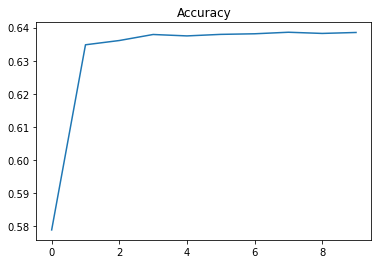

In [105]:
plt.plot(h.history["accuracy"])
plt.title("Accuracy")

Text(0.5, 1.0, 'Loss')

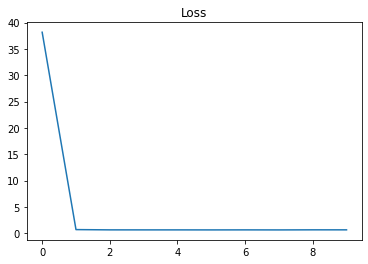

In [106]:
plt.plot(h.history["loss"])
plt.title("Loss")

235/235 [==============================] - 0s 1ms/step


<AxesSubplot:>

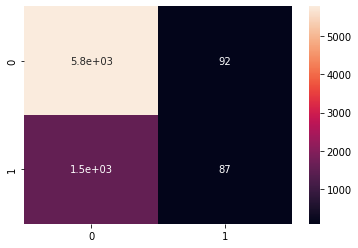

In [107]:
pred = model.predict(X_test)
pred = pred > 0.5
pred = pred.astype("int32")

cm = confusion_matrix(Y_test,pred)
sns.heatmap(cm,annot=True)

In [108]:
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

Accuracy : 0.7824
Precision:  0.4860335195530726
Recall:  0.05347264904732637


### Tuning the Model using Keras Tuner

In [109]:
import kerastuner as kt

In [110]:
def model_builder(hp):
  '''
  Args:
    hp - Keras tuner object
  '''
  # Initialize the Sequential API and start stacking the layers
  model = Sequential()
  # Automatically tunes and select the number of units in the input layer
  # Choosing the optimal value between 32-512 for the input layer
  hp_units = hp.Int('units', min_value=32, max_value=512, step=32)
  model.add(Dense(units=hp_units, input_dim= 50,activation='relu', name='input'))
  # Add next layers
  model.add(Dropout(0.1))
  # Tune the number of units in the next Dense layer
  # Choose an optimal value between 32-512 for the hidden layer
  hp_units = hp.Int('units', min_value=32, max_value=512, step=32)
  model.add(Dense(units=hp_units, activation='relu', name='dense_1'))
  # Add next layers
  # This layer will be the output layer
  model.add(Dropout(0.1))
  model.add(Dense(1, activation='sigmoid'))
  # Tune the learning rate for the optimizer
  # Choose an optimal value from 0.01, 0.001, or 0.0001
  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
  model.compile(optimizer=Adam(learning_rate=hp_learning_rate),
                loss='binary_crossentropy',
                metrics=['accuracy'])
  return model

In [111]:
# Initialize the tuner and set the objective to be increasing accuracy
tuner = kt.Hyperband(model_builder, # the hypermodel
                     objective='val_accuracy', # objective to optimize
max_epochs=10,
factor=3, # factor which you have seen above 
directory='dir', # directory to save logs 
project_name='khyperband')

In [112]:
# hypertuning settings
tuner.search_space_summary() 
#Output:- 

# Search space summary
# Default search space size: 2
# units (Int)
# {'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': None}
# learning_rate (Choice)
# {'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}

Search space summary
Default search space size: 2
units (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}


In [113]:
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
# Perform hypertuning
tuner.search(X_train, Y_train, epochs=10, validation_split=0.2, callbacks=[stop_early])

Trial 4 Complete [00h 00m 23s]
val_accuracy: 0.7843361496925354

Best val_accuracy So Far: 0.9962841272354126
Total elapsed time: 00h 01m 26s

Search: Running Trial #5

Value             |Best Value So Far |Hyperparameter
128               |64                |units
0.0001            |0.0001            |learning_rate
2                 |2                 |tuner/epochs
0                 |0                 |tuner/initial_epoch
2                 |2                 |tuner/bracket
0                 |0                 |tuner/round

Epoch 1/2
875/875 [==============================] - 7s 7ms/step - loss: 334.1133 - accuracy: 0.5642 - val_loss: 284.9930 - val_accuracy: 0.0826
Epoch 2/2
875/875 [==============================] - 7s 8ms/step - loss: 153.7843 - accuracy: 0.5672 - val_loss: 76.1941 - val_accuracy: 0.0815


KeyboardInterrupt: ignored

In [ ]:
best_hp=tuner.get_best_hyperparameters()[0]

In [ ]:
tuner.get_best_hyperparameters()[0]

In [ ]:
tf.keras.backend.reset_uids()

In [ ]:
# Build the model with the optimal hyperparameters
h_model = tuner.hypermodel.build(best_hp)
h_model.summary()
h_model.fit(X_train, Y_train, epochs=10, validation_split=0.2)

In [ ]:
h_model.evaluate(X_test,Y_test, return_dict=True)

In [ ]:
confusion_matrix(Y_test,(h_model.predict(X_test)>0.5).astype("int32"))

In [ ]:
print("Accuracy :",(cm[0,0] + cm[1,1])/(sum(sum(cm))))
print("Precision: ",cm[1,1]/(cm[0,1]+cm[1,1]))
print("Recall: ",cm[1,1]/(cm[1,0]+cm[1,1]))

<p> Overall, feature engineering and feature selection improves the accuracy of most models, except logistic regression which actually saw a decrease. 

In addition, parameter tuning such as through the use of GridSearchCV has also improved the accuracy of most models. 

My attempt to tune the hyperparameter of keras neural network did not manage to improve the accuracy.

<b><u>Some limitations of the analysis and potential mitigations are as follows:</u></b>
1. Some variables have unbalanced proportion of categories. For example, there are more females than males in the dataset. As such, there would be more data that are skewed towards females. As a result, the models developed would predict female data more accurately than males. This applies to many other variables in the dataset. This could be resolved by ensuring that the data collection process is balanced as well as balancing the data before analysis in python.

2. In determining the amount of credit to grant to a customer, the bank might look at historical data. However, other factors like occupation, employement status, income, or remaining bank balance might be potential factors that could lead to better/worse credit risk. Therefore, the analysis could be improved by gathering additional data on the customers.

3. Additionally, with regards to data bias, machine learning models rely heavily on historical data to make predictions, if these data were biased in terms of race, region or any other factors that were not covered in the dataset, the models will perpetuate that bias and lead to unfair and discriminatory practices. To mitigate this, the bank should use diverse and unbiased data to train the model and take steps to address any potential biases in the data.

4. Machine learning models such as Neural Network are complex and often times act as a black box, meaning it's decision making and how it  converts input into output is complex and difficult to interpret. Thus the bank might run into some ethical implications if it was found out later on that the model discriminate credit service against specific gender or race. The bank might want to put more resource into explainable AI research to tackle this issue.